In [2]:
import pandas as pd
import folium
import geopandas as gpd

sf = gpd.read_file("../data/landing/taxi_zones.shp")
zones = pd.read_csv("../data/landing/taxi+_zone_lookup.csv")
sf['geometry'] = sf['geometry'].to_crs("+proj=longlat +ellps=WGS84 +datum=WGS84 +no_defs")
sf.head()


,OBJECTID,Shape_Leng,Shape_Area,zone,LocationID,borough,geometry
0,1,0.116357,0.000782,Newark Airport,1,EWR,"POLYGON ((-74.18445 40.69500, -74.18449 40.695..."
1,2,0.433470,0.004866,Jamaica Bay,2,Queens,"MULTIPOLYGON (((-73.82338 40.63899, -73.82277 ..."
2,3,0.084341,0.000314,Allerton/Pelham Gardens,3,Bronx,"POLYGON ((-73.84793 40.87134, -73.84725 40.870..."
3,4,0.043567,0.000112,Alphabet City,4,Manhattan,"POLYGON ((-73.97177 40.72582, -73.97179 40.725..."
4,5,0.092146,0.000498,Arden Heights,5,Staten Island,"POLYGON ((-74.17422 40.56257, -74.17349 40.562..."


In [11]:
gdf = gpd.GeoDataFrame(
    pd.merge(zones, sf, on='LocationID', how='inner')
)

In [3]:
merged_df = pd.read_csv('..data/curated/merged_df.csv')


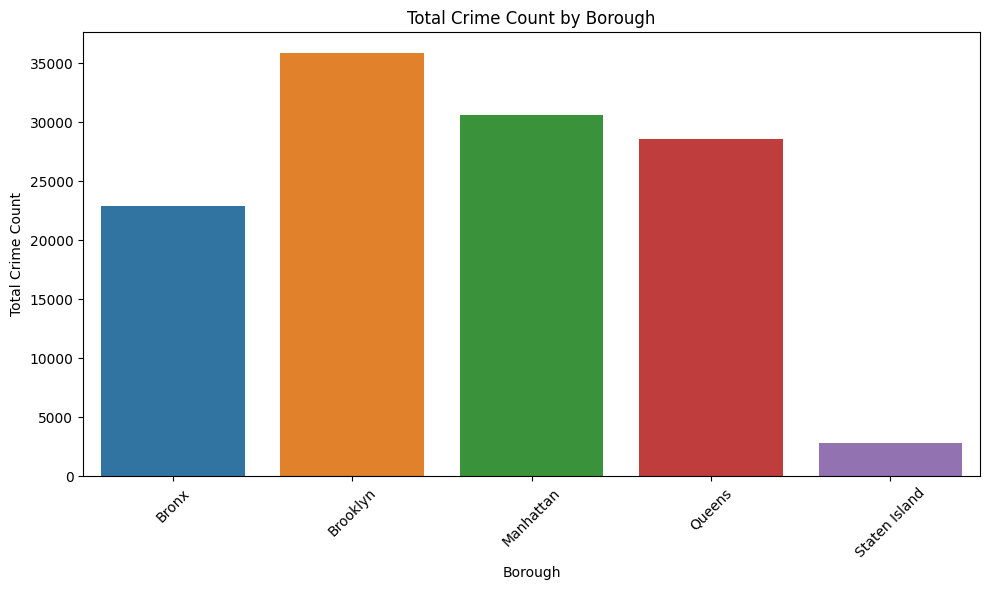

In [7]:
import matplotlib.pyplot as plt
import seaborn as sns
borough_crime = merged_df.groupby('borough')['crime_count'].sum()

# draw the plot by borough
plt.figure(figsize=(10, 6))
sns.barplot(x=borough_crime.index, y=borough_crime.values)
plt.title('Total Crime Count by Borough')
plt.xlabel('Borough')

plt.ylabel('Total Crime Count')
plt.xticks(rotation=45)
plt.tight_layout()
plt.savefig('../plots/Total Crime By Borough.png')
plt.show()

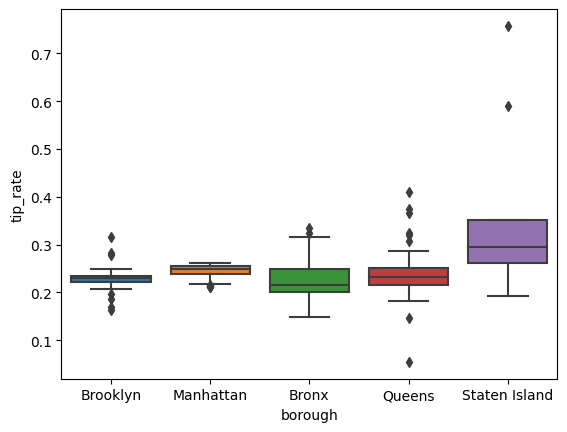

In [8]:
# draw the plot for tip rate by borough
sns.boxplot(data=merged_df, x="borough", y='tip_rate')
plt.savefig('../plots/Tip rate by Borough')
plt.show()

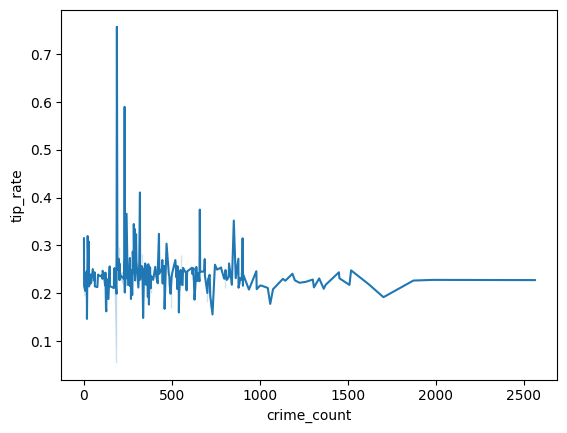

In [10]:
# draw the plot of tip rate vs. crime count
sns.lineplot(data=merged_df, x='crime_count', y='tip_rate')
plt.savefig('../plots/Tip_rate vs. Crime.png')
plt.show()

In [12]:
boroughs_gdf = gpd.read_file('../data/landing/Borough Boundaries.geojson')

In [16]:
#draw geo folium plot for tip rate
m = folium.Map(location=[40.73, -73.74], tiles="Stamen Terrain", zoom_start=10)

for _, row in boroughs_gdf.iterrows():
    
    geometry = row['geometry']
    borough_name = row['boro_name']
    
    # draw the boundaries
    folium.GeoJson(
        geometry,
        style_function=lambda feature: {
            'color': 'red',  
            'weight': 3,  
            'fillOpacity': 0  
        }
    ).add_to(m)
    
    # mark the name
    folium.Marker(
        location=[geometry.centroid.y, geometry.centroid.x],  
        popup=borough_name,  
        icon=folium.DivIcon(html=f"""<div style="font-family: Arial; color: black">{borough_name}</div>""") 
    ).add_to(m)

geoJSON = gdf[['LocationID', 'geometry']].drop_duplicates('LocationID').to_json()

# refer to the folium documentations on more information on how to plot aggregated data.
c = folium.Choropleth(
    geo_data=geoJSON, # geoJSON 
    name='choropleth', # name of plot
    data=merged_df.reset_index(), # data source
    columns=['LocationID','tip_rate'], # the columns required
    key_on='properties.LocationID', # this is from the geoJSON's properties
    fill_color='YlOrRd', # color scheme
    nan_fill_color='black',
    legend_name='Crime Count'
)

c.add_to(m)


m.save('../plots/Tip rate.html')
m

In [17]:
# use the same method to draw the geo folium plot for crime count
m = folium.Map(location=[40.73, -73.74], tiles="Stamen Terrain", zoom_start=10)

for _, row in boroughs_gdf.iterrows():
    
    geometry = row['geometry']
    borough_name = row['boro_name']
    
    
    folium.GeoJson(
        geometry,
        style_function=lambda feature: {
            'color': 'red',  
            'weight': 3,  
            'fillOpacity': 0  
        }
    ).add_to(m)
    
    
    folium.Marker(
        location=[geometry.centroid.y, geometry.centroid.x],  
        popup=borough_name,  
        icon=folium.DivIcon(html=f"""<div style="font-family: Arial; color: black">{borough_name}</div>""")  
    ).add_to(m)

geoJSON = gdf[['LocationID', 'geometry']].drop_duplicates('LocationID').to_json()

# refer to the folium documentations on more information on how to plot aggregated data.
c = folium.Choropleth(
    geo_data=geoJSON, # geoJSON 
    name='choropleth', # name of plot
    data=merged_df.reset_index(), # data source
    columns=['LocationID','crime_count'], # the columns required
    key_on='properties.LocationID', # this is from the geoJSON's properties
    fill_color='YlOrRd', # color scheme
    nan_fill_color='black',
    legend_name='Crime Count'
)

c.add_to(m)


m.save('../plots/Crime Count.html')
m